https://plot.ly/python/reference/#layout-updatemenus

In [1]:
import ANEMO.ANEMO as A
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [2]:
from plotly import __version__
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import plotly.graph_objs as go

init_notebook_mode(connected=True)

In [3]:
time = np.arange(-750, 750, 1)
start_anti, latence = 650, 850

fit = A.Equation.fct_velocity (x=np.arange(len(time)), start_anti=start_anti, latence=latence, v_anti=-20, tau=15., maxi=15., dir_target=-1, do_whitening=False)

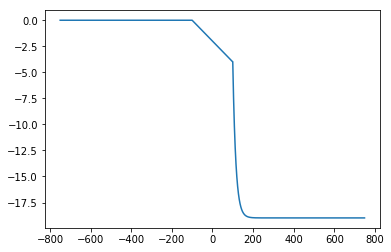

In [4]:
plt.plot(time, fit)

In [5]:
list_start = np.arange(450, 851, 50)
list_lat = np.arange(700, 900, 50)
list_v_anti = np.arange(-10, 10, 2)
print(len(list_start), len(list_lat))

9 4


In [6]:
def generat_data(do_whitening=False) :
    data = []
    i = 0
    for s in range(len(list_start)) :
        data.append(dict(visible = False,
                    line=dict(color='black', width=1),
                    x=time,
                    y = list(A.Equation.fct_velocity(x=np.arange(len(time)),
                                                        start_anti=list_start[s],
                                                        latence=latence,
                                                        v_anti=-10, tau=15.,
                                                        maxi=10., dir_target=-1,
                                                        do_whitening=do_whitening))))
        
    for l in range(len(list_lat)) :
        data.append(dict(visible = False,
                    line=dict(color='black', width=1),
                    x=time,
                    y = list(A.Equation.fct_velocity(x=np.arange(len(time)),
                                                        start_anti=start_anti,
                                                        latence=list_lat[l],
                                                        v_anti=-10, tau=15.,
                                                        maxi=10., dir_target=-1,
                                                        do_whitening=do_whitening))))
    for v in range(len(list_v_anti)) :
        data.append(dict(visible = False,
                    line=dict(color='black', width=1),
                    x=time,
                    y = list(A.Equation.fct_velocity(x=np.arange(len(time)),
                                                        start_anti=start_anti,
                                                        latence=latence,
                                                        v_anti=list_v_anti[v], tau=15.,
                                                        maxi=10., dir_target=-1,
                                                        do_whitening=do_whitening))))
    return data

In [7]:
data_false = generat_data(do_whitening=False)
data_true = generat_data(do_whitening=True)

In [8]:
antis = []
lats = []
vis = []
s=0
l=0

for d in range(len(data_false)) :
    if d < len(list_start) :
        anti = dict(
                method = 'restyle',
                args = ['visible', [False] * len(data_false)])
        anti['args'][1][d] = True
        antis.append(anti)
        

    elif d < len(list_lat)+len(list_start) :
        lat = dict(
                method = 'restyle',
                args = ['visible', [False] * len(data_false)])
        lat['args'][1][d] = True
        lats.append(lat)
    elif d < len(list_lat)+len(list_start)+len(list_v_anti) :
        vi = dict(
                method = 'restyle',
                args = ['visible', [False] * len(data_false)])
        vi['args'][1][d] = True
        vis.append(vi)

sliders = [dict(
                active = len(list_lat),
                currentvalue = {"prefix": "Start_anti: "},
                pad = {"t": 50},
                steps = antis),
          dict(
                active = len(list_start),
                currentvalue = {"prefix": "Latence: "},
                pad = {"t": 150},
                steps = lats),
          dict(
                active = len(list_v_anti),
                currentvalue = {"prefix": "v_anti: "},
                pad = {"t": 200},
                steps = vis)]


layout = go.Layout(title="fonction velocity",
                xaxis=dict(title='Time (ms)', range=[-750, 750]),
                yaxis=dict(title='Velocity (°/s)',range=[-15, 15]),
                sliders=sliders)



data = data_false + data_true
updatemenus = list([

            dict(type = 'buttons',
                  direction = 'left',
                  pad = {'r': 5, 't': 5},
                  active=-1, showactive = True,
                  x = 0.1, y = 1.1,
                  xanchor = 'left', yanchor = 'bottom',
                  buttons=list([
                      dict(label = 'False', method = 'restyle',
                           args = [{'visible':[True, False],
                                    'y': [data_false[i]['y'] for i in range(len(data_false))]}]),
                      dict(label = 'True', method = 'restyle',
                           args=[{'visible':[False, True],
                                  'y': [data_true[i]['y'] for i in range(len(data_true))]}])]))
        ])


annotations = list([dict(text='do_whitening:', x=0, y=1.1, yref='paper',xref='paper',
                         align='left', yanchor='bottom', showarrow=False) ])
layout['updatemenus'] = updatemenus
layout['annotations'] = annotations

fig = go.Figure(data=data, layout=layout)

iplot(fig)